---
title: 🐳MM-Detection-Colab
password: ""
tags:
  - 深度学习
  - Colab
  - MMDetection
katex: false
comments: true
aside: true
date: 2022-06-07 17:06:50
cover: https://s1.imagehub.cc/images/2023/03/31/441a934994f3476a62b08669e4c3eb32.jpeg
top_img:
---

<!--
 * @?: *********************************************************************
 * @Author: Weidows
 * @LastEditors: Weidows
 * @LastEditTime: 2022-04-20 23:11:24
 * @FilePath: \Blog-private\scaffolds\post.md
 * @Description:
 * @!: *********************************************************************
-->

## 序

- Colab 平台对于 `轻量级/边缘计算` 比较方便, 尤其是对这种教程性质的 notebook, 分享和运行都开箱即用

- 但另一方面:

  `因`: 免费版的 Colab 所给的硬件资源不是很稳定, 用太久的话会分不到 GPU, 虽然给的 GPU 肯定是比自己的开发机强很多, 但是跑大型项目肯定带不动 (而且 Colab 单次运行最多持续 6h, 一段时间没动作的话会断连, 断开后再过一阵 runtime 会被重置)

- `果`: 可以用它来学习下怎么搭环境以及一些小测试

  毕竟生产服务器申请不易 / 环境也不能乱动

  受系统和网络限制, 在开发机搭环境并不理想

<a>![分割线](https://s1.imagehub.cc/images/2023/03/30/a9702c938aecc012f41a054d9f568108.png)</a>


## 装环境

> 从安装到放弃到爬出坑 :( \
> 跟着这几篇装的环境:<sup id='cite_ref-2'>[\[2\]](#cite_note-2)</sup><sup id='cite_ref-3'>[\[3\]](#cite_note-3)</sup>, 有借鉴意义但是指导不明确 \
> 个人先跟着官方出的视频教程和 openbayes 上的 notebook 试了试水, 很深 <sup id='cite_ref-1'>[\[1\]](#cite_note-1)</sup>; 最后找到一个源库 tutorial-fork 的 colab-notebook <sup id='cite_ref-4'>[\[4\]](#cite_note-4)</sup>

预先装上 cuda, cudnn (colab自带)

依赖链: `cuda <- pytorch <- mmcv-full <- mmdet`

每一步依赖前面环境的版本, 即使后面能装上也可能不适配, 任何一步有问题都 `can't run`

![](https://s1.imagehub.cc/images/2023/03/31/499acb0f86561a2b720048e02ebcbded.png)


<a>![分割线](https://s1.imagehub.cc/images/2023/03/30/a9702c938aecc012f41a054d9f568108.png)</a>


In [ ]:
# ====================可选, colab并不自带conda=====================
!conda create -n openmmlab -y
!conda activate openmmlab
!conda init

/bin/bash: conda: command not found
/bin/bash: conda: command not found
/bin/bash: conda: command not found


In [ ]:
# ================== 一键装好环境 =======================
# 如果这里有问题可以重启一下内核: 代码执行程序 -> 重新启动代码执行程序

!python -m pip install --upgrade pip

# 注意对应机子配置: https://pytorch.org/
# install dependencies: (use cu111 because colab has CUDA 11.1)
%pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html

# windows 平台不用装了, 一定会卡在这
# https://github.com/open-mmlab/mmcv/blob/master/README_zh-CN.md
%pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html

# 与pip/conda同级的专门给mm-lab用的包管理器, 报错率很高
%pip install openmim

# 依赖 mmcv, 如果用mim装的话大概率有问题
# 后面要用到源码库的 config, 可选用源库安装
%pip install mmdet mmsegmentation

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.1 MB 37.1 MB/s 
  Attempting uninstall: pip
    Found existing installation: pip 21.1.3
    Uninstalling pip-21.1.3:
      Successfully uninstalled pip-21.1.3
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 2.0/2.0 GB 83.9 MB/s eta 0:00:01tcmalloc: large alloc 2041348096 bytes == 0x25c6000 @  0x7fb296fd21e7 0x4a3940 0x4a39cc 0x592b76 0x4df71e 0x59afff 0x515655 0x549576 0x593fce 0x511e2c 0x549576 0x593fce 0x511e2c 0x549576 0x593fce 0x511e2c 0x549576 0x593fce 0x511e2c 0x549576 0x593fce 0x511e2c 0x593dd7 0x511e2c 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576 0x593fce 0x511e2c
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 2.0/2.0 GB 82.2 MB/s eta 0:00:01tcmalloc: large alloc 2551685120 byt

In [ ]:
# 验证安装
!nvcc -V
!pip list | grep mm

from mmcv import collect_env
collect_env()

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
community                     1.0.0b1
googleapis-common-protos      1.56.2
mmcls                         0.23.1
mmcv-full                     1.5.2
mmdet                         2.25.0
mmsegmentation                0.25.0
pyviz-comms                   2.2.0
snowballstemmer               2.2.0
torchsummary                  1.5.1


{'CUDA available': True,
 'CUDA_HOME': '/usr/local/cuda',
 'GCC': 'x86_64-linux-gnu-gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0',
 'GPU 0': 'Tesla T4',
 'MMCV': '1.5.2',
 'MMCV CUDA Compiler': '11.1',
 'MMCV Compiler': 'GCC 7.3',
 'NVCC': 'Cuda compilation tools, release 11.1, V11.1.105',
 'OpenCV': '4.1.2',
 'PyTorch': '1.9.0+cu111',
 'PyTorch compiling details': 'PyTorch built with:\n  - GCC 7.3\n  - C++ Version: 201402\n  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications\n  - Intel(R) MKL-DNN v2.1.2 (Git Hash 98be7e8afa711dc9b66c8ff3504129cb82013cdb)\n  - OpenMP 201511 (a.k.a. OpenMP 4.5)\n  - NNPACK is enabled\n  - CPU capability usage: AVX2\n  - CUDA Runtime 11.1\n  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-gencode;arch=compute_80,code=sm_80;-gencode;arch=comp

### Clone-repo

clone 项目源码库下来, 后面的 `验证/训练` 要用到源码库的配置和工具等 (用到哪个库 Clone 哪个就行, 当然全 clone 也没问题)

注意后面运行前切一下路径

In [17]:
# !rm -rf /content/mmdetection
%cd /content
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
# %pip install -e .

# 后续 pwd = /content/mmdetection

/content
Cloning into 'mmdetection'...
remote: Enumerating objects: 24969, done.
remote: Counting objects: 100% (10/10), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 24969 (delta 3), reused 6 (delta 1), pack-reused 24959
Receiving objects: 100% (24969/24969), 37.76 MiB | 11.27 MiB/s, done.
Resolving deltas: 100% (17495/17495), done.
/content/mmdetection


In [ ]:
# !rm -rf /content/mmdetection3d
%cd /content
!git clone https://github.com/open-mmlab/mmdetection3d.git
%cd mmdetection3d

# mmdetection3d 有一些额外的依赖需要安装
%pip install -e .

# --show 用到open3D来展示, 但只能在本机create窗口, colab 上会报错
# %pip install open3d

# 后续 pwd = /content/mmdetection3d

/content
Cloning into 'mmdetection3d'...
remote: Enumerating objects: 13252, done.
remote: Counting objects: 100% (148/148), done.
remote: Compressing objects: 100% (116/116), done.
remote: Total 13252 (delta 44), reused 102 (delta 32), pack-reused 13104
Receiving objects: 100% (13252/13252), 15.96 MiB | 14.34 MiB/s, done.
Resolving deltas: 100% (9134/9134), done.
/content/mmdetection3d
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/mmdetection3d
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 68.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 83.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 312.6/312.6 kB 35.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 282.0/282.0 kB 35.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━

<a>![分割线](https://s1.imagehub.cc/images/2023/03/30/a9702c938aecc012f41a054d9f568108.png)</a>

## 验证


### Detection

In [ ]:
# mim 也可以用来search/download,不过 doc 在捉迷藏..不知道怎么用
# https://github.com/open-mmlab/mmdetection/tree/master/configs/mask_rcnn
# 跟教程一样的命令...失效了?
# !mim search mmdet --model 'mask r-cnn'
# !mim download mmdet --config mask_rcnn_r50_fpn_2x_coco --dest ./_model

%cd /content/mmdetection

# 下载并分别测试下面两个 pre-trained model-checkpoints
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r50_fpn_2x_coco/mask_rcnn_r50_fpn_2x_coco_bbox_mAP-0.392__segm_mAP-0.354_20200505_003907-3e542a40.pth \
      -O checkpoints/mask_rcnn_r50_fpn_2x_coco_bbox_mAP-0.392__segm_mAP-0.354_20200505_003907-3e542a40.pth
!wget -c https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth \
      -O checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth


--2022-06-10 12:13:06--  https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r50_fpn_2x_coco/mask_rcnn_r50_fpn_2x_coco_bbox_mAP-0.392__segm_mAP-0.354_20200505_003907-3e542a40.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.74.197.77
Connecting to download.openmmlab.com (download.openmmlab.com)|47.74.197.77|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 177866862 (170M) [application/octet-stream]
Saving to: ‘checkpoints/mask_rcnn_r50_fpn_2x_coco_bbox_mAP-0.392__segm_mAP-0.354_20200505_003907-3e542a40.pth’

checkpoints/mask_rc 100%[===================>] 169.63M  9.84MB/s    in 18s     

2022-06-10 12:13:25 (9.20 MB/s) - ‘checkpoints/mask_rcnn_r50_fpn_2x_coco_bbox_mAP-0.392__segm_mAP-0.354_20200505_003907-3e542a40.pth’ saved [177866862/177866862]

--2022-06-10 12:13:25--  https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_0950

load checkpoint from local path: checkpoints/mask_rcnn_r50_fpn_2x_coco_bbox_mAP-0.392__segm_mAP-0.354_20200505_003907-3e542a40.pth


/content/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


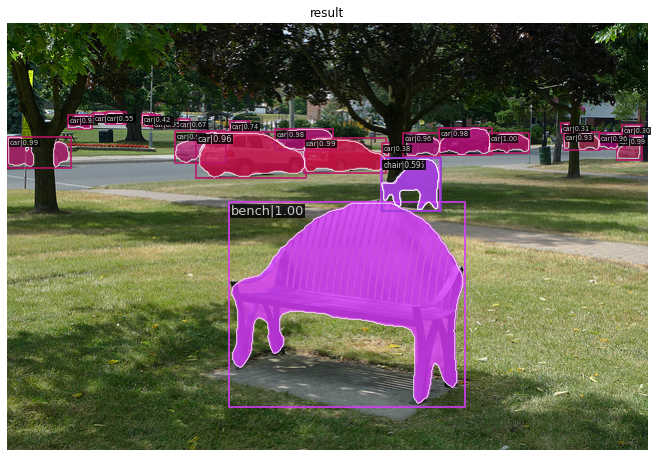

In [ ]:
from mmdet.apis import init_detector, inference_detector, show_result_pyplot

config = 'configs/mask_rcnn/mask_rcnn_r50_fpn_2x_coco.py'
checkpoint = 'checkpoints/mask_rcnn_r50_fpn_2x_coco_bbox_mAP-0.392__segm_mAP-0.354_20200505_003907-3e542a40.pth'

# 在 CPU 上需要设置 device='cpu' ; GPU 上设置 device='cuda:0'
# 使用 mmdetection 源库自带的 demo/demo.jpg
model = init_detector(config, checkpoint, device='cuda:0') 
result = inference_detector(model, 'demo/demo.jpg')

show_result_pyplot(model, 'demo/demo.jpg', result)

load checkpoint from local path: checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth


/content/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


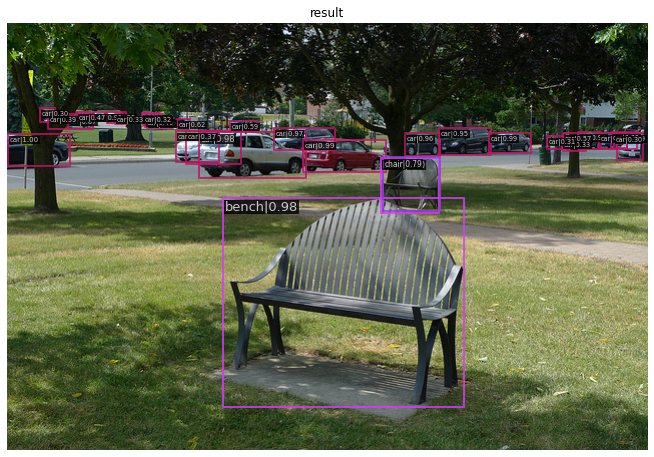

In [ ]:
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector

# Choose to use a config and initialize the detector
config = 'configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco.py'
# Setup a checkpoint file to load
checkpoint = 'checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'

# Set the device to be used for evaluation
device='cuda:0'

# Load the config
config = mmcv.Config.fromfile(config)
# Set pretrained to be None since we do not need pretrained model here
config.model.pretrained = None

# Initialize the detector
model = build_detector(config.model)

# Load checkpoint
checkpoint = load_checkpoint(model, checkpoint, map_location=device)

# Set the classes of models for inference
model.CLASSES = checkpoint['meta']['CLASSES']
# We need to set the model's cfg for inference
model.cfg = config
# Convert the model to GPU
model.to(device)
# Convert the model into evaluation mode
model.eval()

# Use the detector to do inference
img = 'demo/demo.jpg'

result = inference_detector(model, img)
# Let's plot the result
show_result_pyplot(model, img, result, score_thr=0.3)

<a>![分割线](https://s1.imagehub.cc/images/2023/03/30/a9702c938aecc012f41a054d9f568108.png)</a>

### Detection3D


In [ ]:
%cd /content/mmdetection3d
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection3d/v1.0.0_models/votenet/votenet_8x8_scannet-3d-18class/votenet_8x8_scannet-3d-18class_20210823_234503-cf8134fa.pth \
      -O checkpoints/votenet_8x8_scannet-3d-18class_20210823_234503-cf8134fa.pth

/content/mmdetection3d
--2022-06-23 16:57:39--  https://download.openmmlab.com/mmdetection3d/v1.0.0_models/votenet/votenet_8x8_scannet-3d-18class/votenet_8x8_scannet-3d-18class_20210823_234503-cf8134fa.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.74.197.77
Connecting to download.openmmlab.com (download.openmmlab.com)|47.74.197.77|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3890927 (3.7M) [application/octet-stream]
Saving to: ‘checkpoints/votenet_8x8_scannet-3d-18class_20210823_234503-cf8134fa.pth’

checkpoints/votenet 100%[===================>]   3.71M  22.2MB/s    in 0.2s    

2022-06-23 16:57:39 (22.2 MB/s) - ‘checkpoints/votenet_8x8_scannet-3d-18class_20210823_234503-cf8134fa.pth’ saved [3890927/3890927]



In [ ]:
# https://mmdetection3d.readthedocs.io/zh_CN/latest/getting_started.html#id10

from mmdet3d.apis import init_model, inference_detector

config_file = 'configs/votenet/votenet_8x8_scannet-3d-18class.py'
checkpoint_file = 'checkpoints/votenet_8x8_scannet-3d-18class_20210823_234503-cf8134fa.pth'

# 从配置文件和预训练的模型文件中构建模型
model = init_model(config_file, checkpoint_file, device='cuda:0')

# 测试单个文件并可视化结果
point_cloud = 'demo/data/scannet/scene0000_00.bin'
result, data = inference_detector(model, point_cloud)
# 可视化结果并且将结果保存到 'results' 文件夹
model.show_results(data, result, out_dir='results')

/content/mmdetection3d/mmdet3d/models/backbones/mink_resnet.py:10: UserWarning: Please follow `getting_started.md` to install MinkowskiEngine.`
  'Please follow `getting_started.md` to install MinkowskiEngine.`')
/usr/local/lib/python3.7/dist-packages/mmcv/cnn/bricks/conv_module.py:151: UserWarning: Unnecessary conv bias before batch/instance norm
  'Unnecessary conv bias before batch/instance norm')


load checkpoint from local path: checkpoints/votenet_8x8_scannet-3d-18class_20210823_234503-cf8134fa.pth


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


<a>![分割线](https://s1.imagehub.cc/images/2023/03/30/a9702c938aecc012f41a054d9f568108.png)</a>

## Custom-training

1. 选择+下载预训练模型和数据集

    参数解释: `mask_rcnn_r50_fpn_2x_coco`

    mask_rcnn 中不同的 backbone (主干网络)

    r50: 50层ResNet

    fpn: 特征金字塔

    2x: learning rate schedule

2. 定义数据集类 + config
3. 调用 API 训练 + 评估
4. 用训练好的模型推理测试


---

### Detection


--2022-06-23 18:02:38--  https://download.openmmlab.com/mmdetection/data/kitti_tiny.zip
Resolving download.openmmlab.com (download.openmmlab.com)... 47.74.197.77
Connecting to download.openmmlab.com (download.openmmlab.com)|47.74.197.77|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6918271 (6.6M) [application/zip]
Saving to: ‘kitti_tiny.zip’

kitti_tiny.zip      100%[===================>]   6.60M  15.2MB/s    in 0.4s    

2022-06-23 18:02:39 (15.2 MB/s) - ‘kitti_tiny.zip’ saved [6918271/6918271]



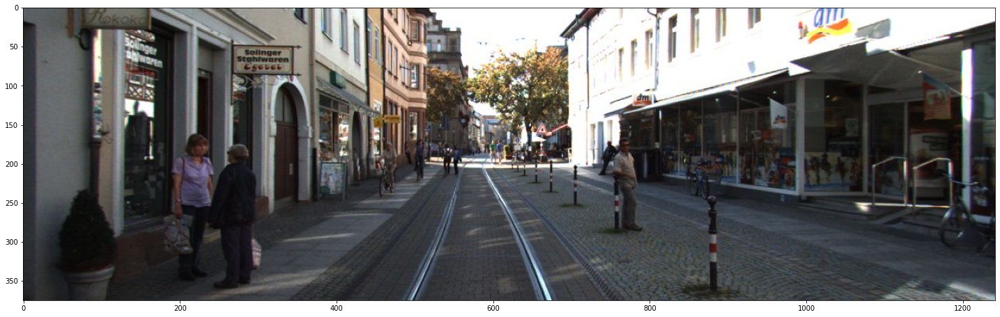

In [18]:
# pre-trained model 在上面下载好了, 这里只下载数据集
!wget https://download.openmmlab.com/mmdetection/data/kitti_tiny.zip
!unzip kitti_tiny.zip > /dev/null

# Let's take a look at the dataset image
import mmcv
import matplotlib.pyplot as plt

img = mmcv.imread('kitti_tiny/training/image_2/000073.jpeg')
plt.figure(figsize=(25, 20))
plt.imshow(mmcv.bgr2rgb(img))
plt.show()

In [ ]:
# 自定义数据集格式 'KittiTinyDataset' 并注册到 mmdet
import copy
import os.path as osp

import mmcv
import numpy as np

from mmdet.datasets.builder import DATASETS
from mmdet.datasets.custom import CustomDataset

@DATASETS.register_module()
class KittiTinyDataset(CustomDataset):

    CLASSES = ('Car', 'Pedestrian', 'Cyclist')

    def load_annotations(self, ann_file):
        cat2label = {k: i for i, k in enumerate(self.CLASSES)}
        # load image list from file
        image_list = mmcv.list_from_file(self.ann_file)
    
        data_infos = []
        # convert annotations to middle format
        for image_id in image_list:
            filename = f'{self.img_prefix}/{image_id}.jpeg'
            image = mmcv.imread(filename)
            height, width = image.shape[:2]
    
            data_info = dict(filename=f'{image_id}.jpeg', width=width, height=height)
    
            # load annotations
            label_prefix = self.img_prefix.replace('image_2', 'label_2')
            lines = mmcv.list_from_file(osp.join(label_prefix, f'{image_id}.txt'))
    
            content = [line.strip().split(' ') for line in lines]
            bbox_names = [x[0] for x in content]
            bboxes = [[float(info) for info in x[4:8]] for x in content]
    
            gt_bboxes = []
            gt_labels = []
            gt_bboxes_ignore = []
            gt_labels_ignore = []
    
            # filter 'DontCare'
            for bbox_name, bbox in zip(bbox_names, bboxes):
                if bbox_name in cat2label:
                    gt_labels.append(cat2label[bbox_name])
                    gt_bboxes.append(bbox)
                else:
                    gt_labels_ignore.append(-1)
                    gt_bboxes_ignore.append(bbox)

            data_anno = dict(
                bboxes=np.array(gt_bboxes, dtype=np.float32).reshape(-1, 4),
                labels=np.array(gt_labels, dtype=np.long),
                bboxes_ignore=np.array(gt_bboxes_ignore,
                                       dtype=np.float32).reshape(-1, 4),
                labels_ignore=np.array(gt_labels_ignore, dtype=np.long))

            data_info.update(ann=data_anno)
            data_infos.append(data_info)

        return data_infos

In [ ]:
# mmdet 配置
from mmcv import Config
from mmdet.apis import set_random_seed

cfg = Config.fromfile('configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_1x_coco.py')
# If we need to finetune a model based on a pre-trained detector, we need to use load_from to set the path of checkpoints.
cfg.load_from = 'checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'

# Modify dataset type and path
cfg.dataset_type = 'KittiTinyDataset'
cfg.data_root = 'kitti_tiny/'

cfg.data.test.type = 'KittiTinyDataset'
cfg.data.test.data_root = 'kitti_tiny/'
cfg.data.test.ann_file = 'train.txt'
cfg.data.test.img_prefix = 'training/image_2'

cfg.data.train.type = 'KittiTinyDataset'
cfg.data.train.data_root = 'kitti_tiny/'
cfg.data.train.ann_file = 'train.txt'
cfg.data.train.img_prefix = 'training/image_2'

cfg.data.val.type = 'KittiTinyDataset'
cfg.data.val.data_root = 'kitti_tiny/'
cfg.data.val.ann_file = 'val.txt'
cfg.data.val.img_prefix = 'training/image_2'

# modify num classes of the model in box head
cfg.model.roi_head.bbox_head.num_classes = 3

# Set up working dir to save files and logs.
cfg.work_dir = './tutorial_exps'

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.
cfg.optimizer.lr = 0.02 / 8
cfg.lr_config.warmup = None
cfg.log_config.interval = 10

# Change the evaluation metric since we use customized dataset.
cfg.evaluation.metric = 'mAP'
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 12
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 12

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)

cfg.device='cuda'
cfg.gpu_ids = range(1)

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

# We can initialize the logger for training and have a look at the final config used for training
# print(f'Config:\n{cfg.pretty_text}')


In [ ]:
# Train a new detector
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector


# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(cfg.model)
#  build_detector( cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))

# 报错:AttributeError: 'ConfigDict' object has no attribute 'device'
# https://github.com/open-mmlab/mmdetection/issues/7901
# 在上面 cfg 添加了 cfg.device='cuda'
train_detector(model, datasets, cfg, distributed=False, validate=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int` for which `np.compat.long` is itself an alias. Doing this will not modify any behaviour and is safe. When replacing `np.long`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:57: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int`

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 25/25, 9.8 task/s, elapsed: 3s, ETA:     0s
---------------iou_thr: 0.5---------------


2022-06-07 16:43:30,260 - mmdet - INFO - 
+------------+-----+------+--------+-------+
| class      | gts | dets | recall | ap    |
+------------+-----+------+--------+-------+
| Car        | 62  | 133  | 0.984  | 0.888 |
| Pedestrian | 13  | 40   | 0.846  | 0.768 |
| Cyclist    | 7   | 50   | 0.571  | 0.114 |
+------------+-----+------+--------+-------+
| mAP        |     |      |        | 0.590 |
+------------+-----+------+--------+-------+
2022-06-07 16:43:30,268 - mmdet - INFO - Epoch(val) [12][25]	AP50: 0.5900, mAP: 0.5899


In [ ]:
# load tensorboard in colab
%load_ext tensorboard

# see curves in tensorboard
%tensorboard --logdir ./tutorial_exps

<IPython.core.display.Javascript object>

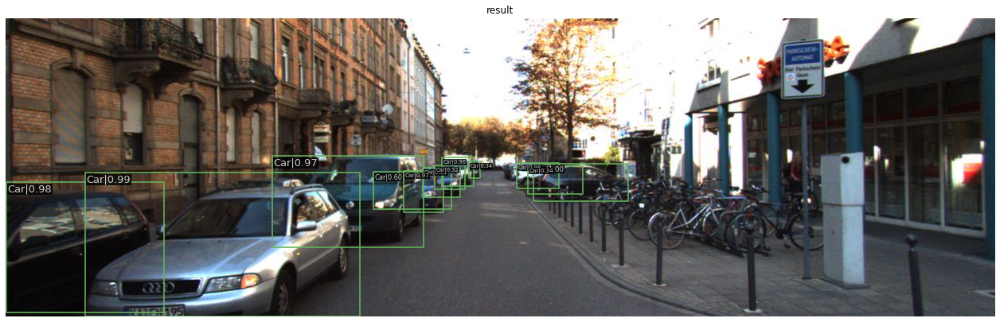

In [ ]:
img = mmcv.imread('kitti_tiny/training/image_2/000068.jpeg')

model.cfg = cfg
result = inference_detector(model, img)
show_result_pyplot(model, img, result)

<a>![分割线](https://s1.imagehub.cc/images/2023/03/30/a9702c938aecc012f41a054d9f568108.png)</a>

### Detection3D


#### 单模态点云-3DDetect

可以简单的把流程看做: `把. bin点云数据 转换为 .obj点云和预测 3D 框的可视化结果`

In [ ]:
%cd /content/mmdetection3d
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection3d/v0.1.0_models/second/hv_second_secfpn_6x8_80e_kitti-3d-car/hv_second_secfpn_6x8_80e_kitti-3d-car_20200620_230238-393f000c.pth \
      -O checkpoints/hv_second_secfpn_6x8_80e_kitti-3d-car_20200620_230238-393f000c.pth
  
!wget -c https://download.openmmlab.com/mmdetection3d/v1.0.0_models/votenet/votenet_16x8_sunrgbd-3d-10class/votenet_16x8_sunrgbd-3d-10class_20210820_162823-bf11f014.pth \
      -O checkpoints/votenet_16x8_sunrgbd-3d-10class_20210820_162823-bf11f014.pth

!python \
  demo/pcd_demo.py \
  demo/data/kitti/kitti_000008.bin \
  configs/second/hv_second_secfpn_6x8_80e_kitti-3d-car.py \
  checkpoints/hv_second_secfpn_6x8_80e_kitti-3d-car_20200620_230238-393f000c.pth \
  --out-dir /content/mmdetection3d/result/

!python \
  demo/pcd_demo.py \
  demo/data/sunrgbd/sunrgbd_000017.bin \
  configs/votenet/votenet_16x8_sunrgbd-3d-10class.py \
  checkpoints/votenet_16x8_sunrgbd-3d-10class_20210820_162823-bf11f014.pth \
  --out-dir /content/mmdetection3d/result/

/content/mmdetection3d
mkdir: cannot create directory ‘checkpoints’: File exists
--2022-06-20 16:05:19--  https://download.openmmlab.com/mmdetection3d/v0.1.0_models/second/hv_second_secfpn_6x8_80e_kitti-3d-car/hv_second_secfpn_6x8_80e_kitti-3d-car_20200620_230238-393f000c.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.88.36.72
Connecting to download.openmmlab.com (download.openmmlab.com)|47.88.36.72|:443... connected.
HTTP request sent, awaiting response... 200 OK

    The file is already fully retrieved; nothing to do.

--2022-06-20 16:05:20--  https://download.openmmlab.com/mmdetection3d/v1.0.0_models/votenet/votenet_16x8_sunrgbd-3d-10class/votenet_16x8_sunrgbd-3d-10class_20210820_162823-bf11f014.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.88.36.72
Connecting to download.openmmlab.com (download.openmmlab.com)|47.88.36.72|:443... connected.
HTTP request sent, awaiting response... 200 OK

    The file is already fully retrieved; nothing to d

#### 多模态点云加图像-3DDetect

通常是 点云+图像, 数据集需要额外的 annotation 提供 3D 到 2D 的仿射矩阵

--2022-06-23 18:07:17--  https://download.openmmlab.com/mmdetection3d/v1.0.0_models/mvxnet/dv_mvx-fpn_second_secfpn_adamw_2x8_80e_kitti-3d-3class/dv_mvx-fpn_second_secfpn_adamw_2x8_80e_kitti-3d-3class_20210831_060805-83442923.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.28
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.28|:443... connected.
HTTP request sent, awaiting response... 200 OK

    The file is already fully retrieved; nothing to do.

/content/mmdetection3d/mmdet3d/models/backbones/mink_resnet.py:10: UserWarning: Please follow `getting_started.md` to install MinkowskiEngine.`
  'Please follow `getting_started.md` to install MinkowskiEngine.`')
/content/mmdetection3d/mmdet3d/models/dense_heads/anchor3d_head.py:85: UserWarning: dir_offset and dir_limit_offset will be depressed and be incorporated into box coder in the future
  'dir_offset and dir_limit_offset will be depressed and be '
load checkpoint from local path: checkp

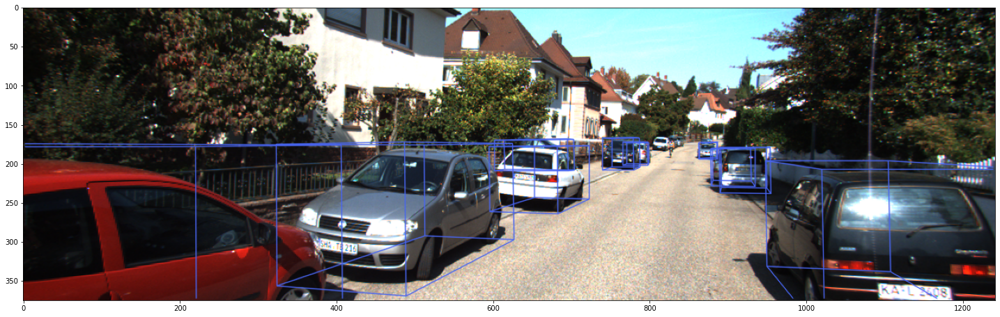

In [24]:
!wget -c https://download.openmmlab.com/mmdetection3d/v1.0.0_models/mvxnet/dv_mvx-fpn_second_secfpn_adamw_2x8_80e_kitti-3d-3class/dv_mvx-fpn_second_secfpn_adamw_2x8_80e_kitti-3d-3class_20210831_060805-83442923.pth \
      -O checkpoints/dv_mvx-fpn_second_secfpn_adamw_2x8_80e_kitti-3d-3class_20210831_060805-83442923.pth

!rm -rf result/kitti_000008

!python \
  demo/multi_modality_demo.py \
  demo/data/kitti/kitti_000008.bin \
  demo/data/kitti/kitti_000008.png \
  demo/data/kitti/kitti_000008_infos.pkl \
  configs/mvxnet/dv_mvx-fpn_second_secfpn_adamw_2x8_80e_kitti-3d-3class.py \
  checkpoints/dv_mvx-fpn_second_secfpn_adamw_2x8_80e_kitti-3d-3class_20210831_060805-83442923.pth \
  --out-dir /content/mmdetection3d/result/

import matplotlib.pyplot as plt

plt.figure(figsize=(25, 20))
plt.imshow(plt.imread('result/kitti_000008/kitti_000008_pred.png'))

#### 单目图像-3DDetect

可以理解为在多模态上去掉点云数据 (当然数据集会有所变动), 效果不如多模态

--2022-06-23 18:06:22--  https://download.openmmlab.com/mmdetection3d/v0.1.0_models/fcos3d/fcos3d_r101_caffe_fpn_gn-head_dcn_2x8_1x_nus-mono3d/fcos3d_r101_caffe_fpn_gn-head_dcn_2x8_1x_nus-mono3d_20210715_235813-4bed5239.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.74.197.77
Connecting to download.openmmlab.com (download.openmmlab.com)|47.74.197.77|:443... connected.
HTTP request sent, awaiting response... 200 OK

    The file is already fully retrieved; nothing to do.

/content/mmdetection3d/mmdet3d/models/backbones/mink_resnet.py:10: UserWarning: Please follow `getting_started.md` to install MinkowskiEngine.`
  'Please follow `getting_started.md` to install MinkowskiEngine.`')
load checkpoint from local path: checkpoints/fcos3d_r101_caffe_fpn_gn-head_dcn_2x8_1x_nus-mono3d_20210715_235813-4bed5239.pth
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject 

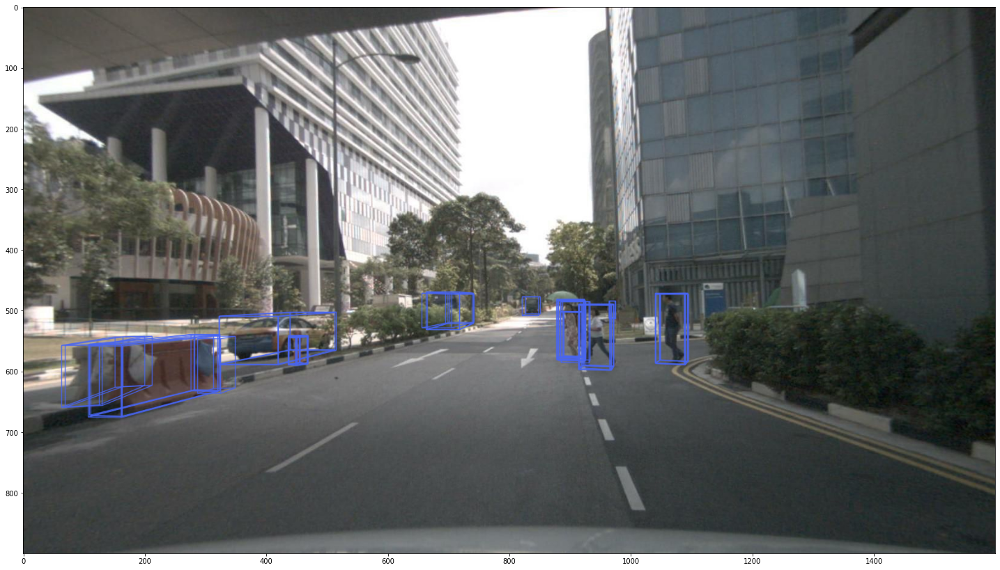

In [22]:
!wget -c https://download.openmmlab.com/mmdetection3d/v0.1.0_models/fcos3d/fcos3d_r101_caffe_fpn_gn-head_dcn_2x8_1x_nus-mono3d/fcos3d_r101_caffe_fpn_gn-head_dcn_2x8_1x_nus-mono3d_20210715_235813-4bed5239.pth \
      -O checkpoints/fcos3d_r101_caffe_fpn_gn-head_dcn_2x8_1x_nus-mono3d_20210715_235813-4bed5239.pth

!python \
  demo/mono_det_demo.py \
  demo/data/nuscenes/n015-2018-07-24-11-22-45+0800__CAM_BACK__1532402927637525.jpg \
  demo/data/nuscenes/n015-2018-07-24-11-22-45+0800__CAM_BACK__1532402927637525_mono3d.coco.json \
  configs/fcos3d/fcos3d_r101_caffe_fpn_gn-head_dcn_2x8_1x_nus-mono3d_finetune.py \
  checkpoints/fcos3d_r101_caffe_fpn_gn-head_dcn_2x8_1x_nus-mono3d_20210715_235813-4bed5239.pth \
  --out-dir /content/mmdetection3d/result/

import matplotlib.pyplot as plt

plt.figure(figsize=(25, 20))
plt.imshow(plt.imread('result/n015-2018-07-24-11-22-45+0800__CAM_BACK__1532402927637525/n015-2018-07-24-11-22-45+0800__CAM_BACK__1532402927637525_pred.png'))

#### 点云-Segment

由于图像/视频很难做到定位以及测距的目标, 目前做 segmentation 只能用点云, 而且目前的模型仅支持室内

In [ ]:
!wget -c https://download.openmmlab.com/mmdetection3d/v0.1.0_models/pointnet2/pointnet2_ssg_16x2_cosine_200e_scannet_seg-3d-20class/pointnet2_ssg_16x2_cosine_200e_scannet_seg-3d-20class_20210514_143644-ee73704a.pth \
      -O checkpoints/pointnet2_ssg_16x2_cosine_200e_scannet_seg-3d-20class_20210514_143644-ee73704a.pth


!python \
  demo/pc_seg_demo.py \
  demo/data/scannet/scene0000_00.bin \
  configs/pointnet2/pointnet2_ssg_16x2_cosine_200e_scannet_seg-3d-20class.py \
  checkpoints/pointnet2_ssg_16x2_cosine_200e_scannet_seg-3d-20class_20210514_143644-ee73704a.pth \
  --out-dir /content/mmdetection3d/result/

--2022-06-20 17:28:15--  https://download.openmmlab.com/mmdetection3d/v0.1.0_models/pointnet2/pointnet2_ssg_16x2_cosine_200e_scannet_seg-3d-20class/pointnet2_ssg_16x2_cosine_200e_scannet_seg-3d-20class_20210514_143644-ee73704a.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.88.36.72
Connecting to download.openmmlab.com (download.openmmlab.com)|47.88.36.72|:443... connected.
HTTP request sent, awaiting response... 200 OK

    The file is already fully retrieved; nothing to do.

/content/mmdetection3d/mmdet3d/models/backbones/mink_resnet.py:10: UserWarning: Please follow `getting_started.md` to install MinkowskiEngine.`
  'Please follow `getting_started.md` to install MinkowskiEngine.`')
/usr/local/lib/python3.7/dist-packages/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``a

<a>![分割线](https://s1.imagehub.cc/images/2023/03/30/a9702c938aecc012f41a054d9f568108.png)</a>

## 借物表

<a name='cite_note-1' href='#cite_ref-1'>[1]</a>: https://openbayes.com/console/wrh/containers/t93t3LTXlgU

<a name='cite_note-2' href='#cite_ref-2'>[2]</a>: [MMDetection 2.3 安装教程](https://zhuanlan.zhihu.com/p/163645165)

<a name='cite_note-3' href='#cite_ref-3'>[3]</a>: https://mmdetection.readthedocs.io/zh_CN/latest/get_started.html#mmdetection

<a name='cite_note-4' href='#cite_ref-4'>[4]</a>: https://colab.research.google.com/github/ZwwWayne/mmdetection/blob/update-colab/demo/MMDet_Tutorial.ipynb#scrollTo=8M5KUnX7Np3h
